In [12]:
from collections import OrderedDict

import os
import sys

import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import models
import torchvision.utils as vutils

from attribution.benchmark.sanity_check import get_model
from attribution.benchmark.transforms import get_transform
from attribution.utils import get_device

from orig_method import Perturbation
# from examples.sanity_check_suite import archs, methods, examples, base_results_dir

In [4]:
plt.rc('xtick',labelsize=14)
plt.rc('ytick',labelsize=14)
plt.rc('axes',titlesize=24, labelsize=20)

In [5]:
base_image_dir = '/private/home/ruthfong/code/attribution/data/datasets/imagenet12/061417/val'
base_results_dir = '/private/home/ruthfong/code/attribution/data/sanity_checks'

In [6]:
arch = "vgg16"
method = "orig"

img_name = "ILSVRC2012_val_00015410"
class_id = 13

In [55]:
examples = [
    ("ILSVRC2012_val_00015410", 13, "junco"),
    ("ILSVRC2012_val_00010495", 987, "corn"),
    ("ILSVRC2012_val_00021206", 184, "Irish terrier"),
]

In [ ]:
modules_to_run = [
    "conv1",
    "layer1.0.conv1",
    "layer1.1.conv1",
    "layer1.2.conv1",
    "layer2.0.conv1",
    "layer2.1.conv1",
    "layer2.2.conv1",
    "layer2.3.conv1",
    "layer3.0.conv1",
    "layer3.1.conv1",
    "layer3.2.conv1",
    "layer3.3.conv1",
    "layer3.4.conv1",
    "layer3.5.conv1",
    "layer4.0.conv1",
    "layer4.1.conv1",
    "layer4.2.conv1",
    "fc",
]

In [ ]:
modules_to_run = [
    "conv1",
    "layer1.0.conv1",
    "layer1.1.conv1",
    "layer1.2.conv1",
    "layer2.0.conv1",
    "layer2.1.conv1",
    "layer2.2.conv1",
    "layer2.3.conv1",
    "layer3.0.conv1",
    "layer3.1.conv1",
    "layer3.2.conv1",
    "layer3.3.conv1",
    "layer3.4.conv1",
    "layer3.5.conv1",
    "layer4.0.conv1",
    "layer4.1.conv1",
    "layer4.2.conv1",
    "fc",
]

In [ ]:
resnet50_names = OrderedDict([
    ("conv1", "conv1"),
    ("layer1.0.conv1", "layer1.0.conv1"),
])

In [38]:
vgg16_names = OrderedDict([
    ("features.0", "conv1_1"),
    ("features.2", "conv1_2"),
    ("features.5", "conv2_1"),
    ("features.7", "conv2_2"),
    ("features.10", "conv3_1"),
    ("features.12", "conv3_2"),
    ("features.14", "conv3_3"),
    ("features.17", "conv4_1"),
    ("features.19", "conv4_2"),
    ("features.21", "conv4_3"),
    ("features.24", "conv5_1"),
    ("features.26", "conv5_2"),
    ("features.28", "conv5_3"),
    ("classifier.0", "fc6"),
    ("classifier.3", "fc7"),
    ("classifier.6", "fc8"),
    (None, "orig")
])

In [79]:
modules_to_run = [
    "features.0",
    "features.5",
    "features.10",
    "features.17",
    "features.24",
    # "features.21",
    "classifier.0",
    "classifier.3",
    "classifier.6",
    None
]

modules_to_run = modules_to_run[::-1]

In [7]:
def normalize(x):
    x_max = x.max()
    x_min = x.min()
    return (x - x_min) / (x_max - x_min)

In [80]:
[i for i in range(len(results["module_names"])) if results["module_names"][i] in modules_to_run]

[0, 1, 2, 3, 6, 9, 12, 14, 16]

In [84]:
def plot_results(results, index=None, method_name=None, include_orig=False, include_title=False,
                 save_path=None, overlay=False, overlay_text=None, modules_to_run=None):
    transform = get_transform((224, 224), dataset="imagenet12")

    img = Image.open(os.path.join(base_image_dir, results["image_path"])).convert("RGB")
    x = transform(img).unsqueeze(0)

    if modules_to_run is None:
        num_layers = results["cum_saliency"].shape[0]
        module_range = range(num_layers)
    else:
        num_layers = len(modules_to_run)
        module_range = [i for i in range(len(results["module_names"])) if results["module_names"][i] in modules_to_run]
        
    n_cols = num_layers + 1 if include_orig else num_layers
    buffer = 1 if include_orig else 0
    f, ax = plt.subplots(1, n_cols, figsize=(4*(1+n_cols), 4))

    if include_orig:
        ax[0].imshow(np.transpose(vutils.make_grid(x, normalize=True), (1, 2, 0)))

    if method_name is not None:
        ax[0].set_ylabel(method_name, fontsize=24)

    if overlay_text is not None:
        props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
        ax[0].text(0.05, 0.95, overlay_text, transform=ax[0].transAxes, fontsize=16,
                   verticalalignment='top', bbox=props)

    for i, mod_i in enumerate(module_range):
        if index is None:
            saliency = results["cum_saliency"][mod_i][0]
        else:
            # saliency = torch.sum(results["cum_saliency"][i], 0)[0]
            saliency = results["cum_saliency"][mod_i][index][0]
        if overlay:
            ax[i+buffer].imshow(np.transpose(vutils.make_grid(x, normalize=True), (1, 2, 0)))
            ax[i+buffer].imshow(normalize(saliency).cpu().data.numpy(), cmap="jet", alpha=0.5)
        else:
            ax[i+buffer].imshow(normalize(saliency).cpu().data.numpy(), cmap="Reds")
        
        if include_title:
            if results["arch"] == "vgg16":
                ax[i+buffer].set_title(vgg16_names[results["module_names"][i]])
            else:
                assert False

    for a in ax:
        a.set_xticks([])
        a.set_yticks([])

    # plt.tight_layout(h_pad=0, w_pad=0)
    plt.subplots_adjust(wspace=0.05)

    if save_path:
        plt.savefig(save_path, format=os.path.splitext(save_path)[1].replace('.', ''))
    plt.show()

[-0.028418228, -0.020985689, -0.019375434, -0.024510516, -0.04711503]


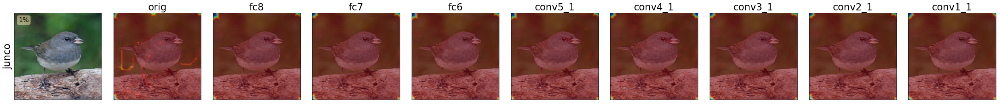

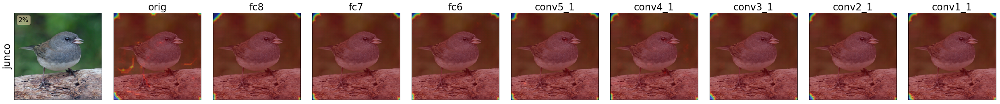

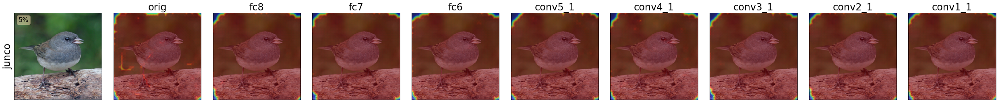

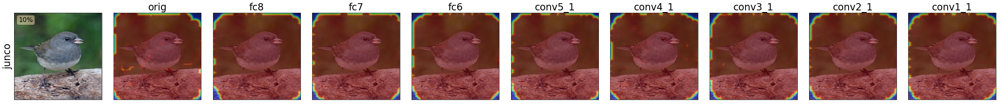

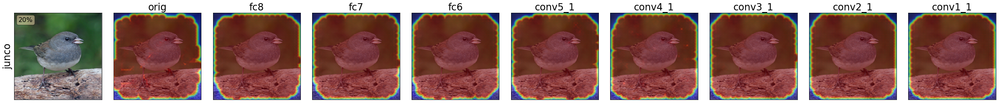

[-0.12774748, -0.13166082, -0.15228157, -0.15364338, -0.15464824]


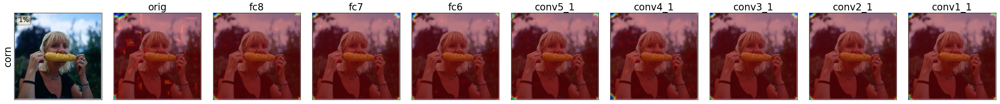

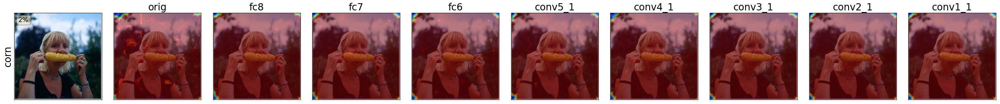

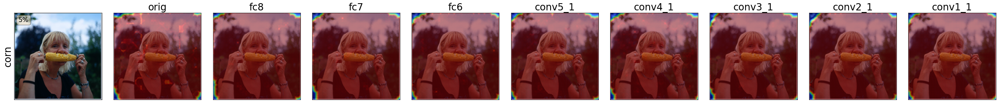

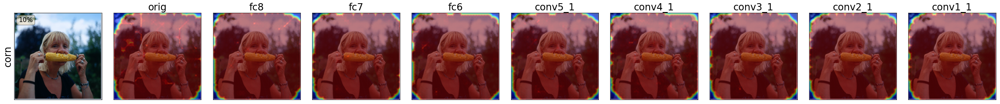

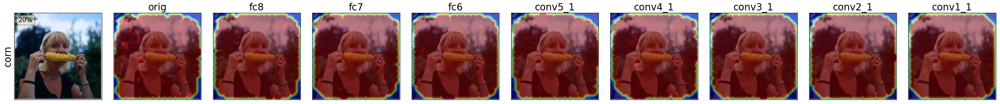

[-0.15325065, -0.16209938, -0.167401, -0.13939722, -0.11046148]


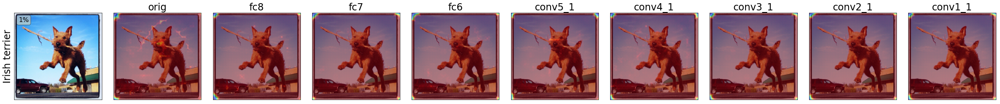

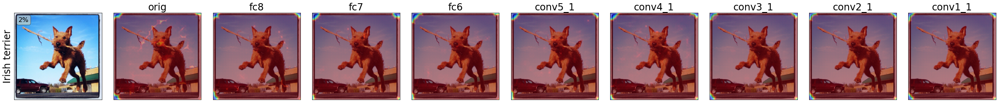

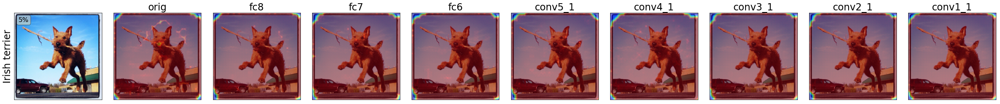

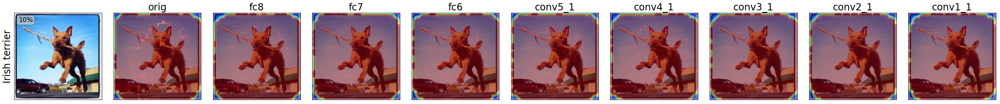

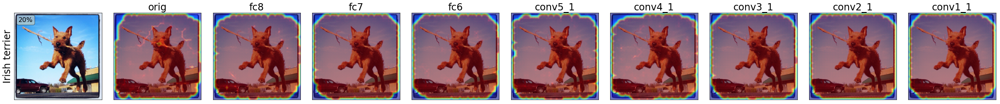

[-0.02843679, -0.022003664, -0.013902285, -0.02335259, -0.039445017]


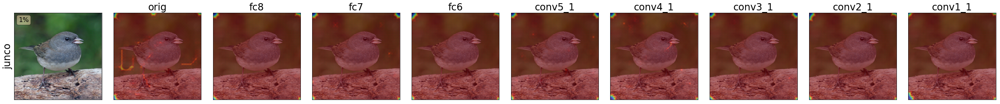

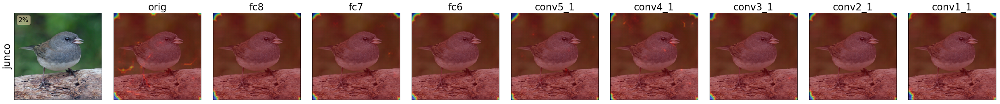

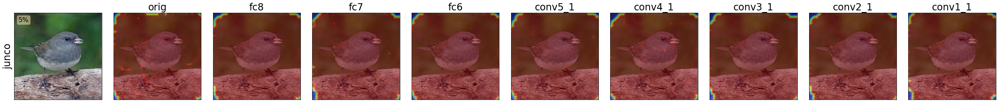

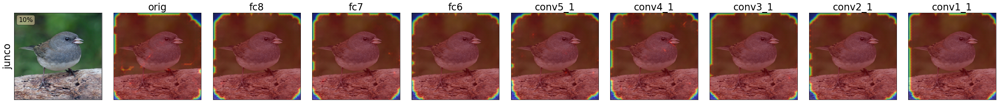

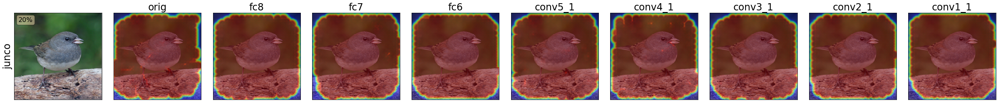

[-0.121054, -0.12194554, -0.17596711, -0.15401763, -0.16957301]


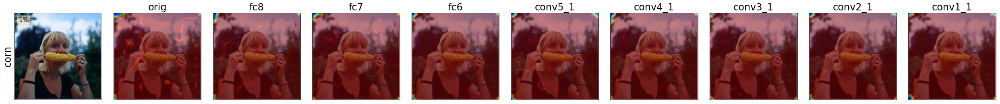

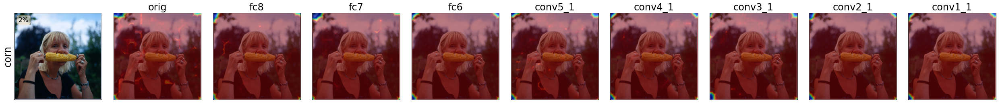

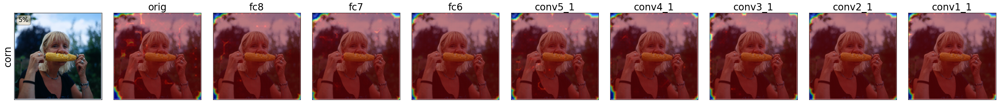

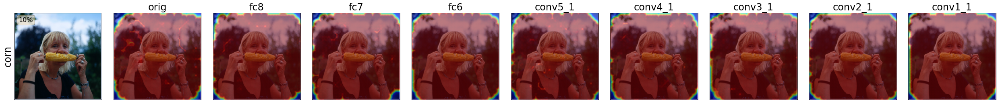

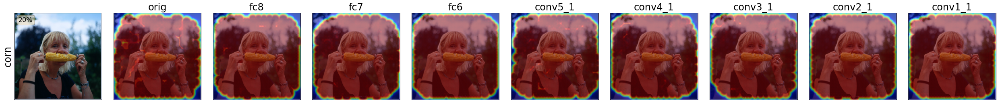

[-0.14750141, -0.17109327, -0.14917912, -0.17092349, -0.105307385]


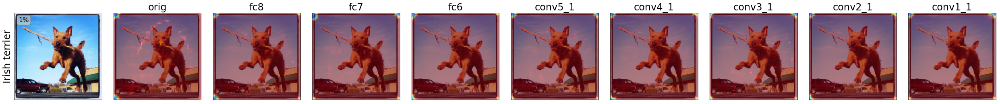

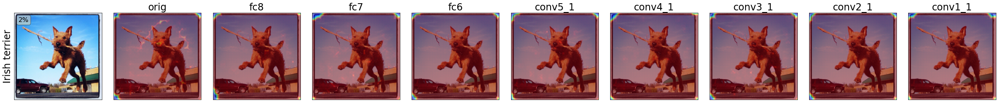

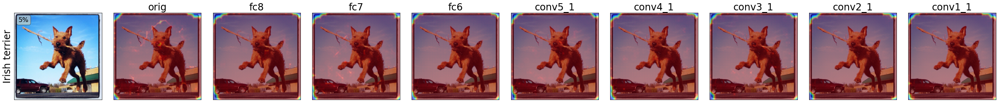

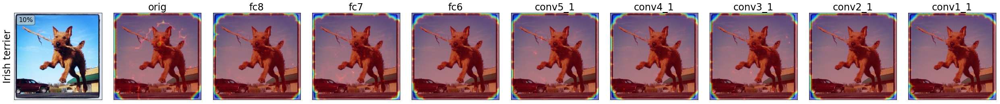

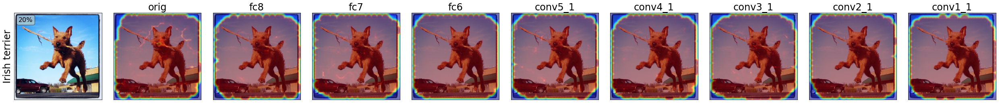

In [101]:
method = "orig"
for rand_type in ["cascade", "independent"]:
# for rand_type in ["cascade"]:
    for img_name, class_id, class_name in examples:
        prefix = "{}-{}-{}-{}-{}-class{}".format(arch, method, "variant0v2", rand_type, img_name, class_id)
        # prefix = "{}-{}--{}{}-{}-class{}".format(arch, method, "variant0", rand_type, img_name, class_id)
        # prefix = "{}-{}-{}-{}-class{}".format(arch, method, rand_type, img_name, class_id)
        results_prefix = os.path.join(base_results_dir, prefix)

        #results_prefix = os.path.join(base_results_dir,
        #                                 "{}-{}-{}-{}-class{}-obs".format(arch, method, rand_type, img_name, class_id))
        results = torch.load("{}.pth".format(results_prefix))

        device = get_device()

        model = get_model(results["arch"])
        model.eval()
        model.to(device)

        transform = get_transform((224, 224), dataset="imagenet12")

        img = Image.open(os.path.join(base_image_dir, results["image_path"])).convert("RGB")
        x = transform(img).unsqueeze(0).to(device)

        perturbation = Perturbation(x, model, depth=0, num_levels=8,
                                    type='blur').to(device)

        x_perturbed = perturbation.apply(torch.zeros_like(results['cum_saliency'][0][area_i]))

        y_orig = model(x).cpu().data.numpy()
        y_perturbed = model(x_perturbed).cpu().data.numpy()
        ys = []

        for area_i in range(len(results['areas'])):
            x_ = perturbation.apply(1-results['cum_saliency'][0][area_i])
            y = model(x_).cpu().data.numpy()
            ys.append(y[0, class_id])

        area_effects = [(y-y_perturbed[0, class_id])/(y_orig[0, class_id]-y_perturbed[0, class_id]) for y in ys]

        print(area_effects)
        # area_i = np.where(np.array(area_effects) > 1.)[0][0]

        areas = results['areas']
        for area_i in range(len(areas)):
            save_prefix = os.path.join(base_results_dir, "figures", prefix)
            save_path = "{}_{:d}_title.pdf".format(save_prefix, int(areas[area_i] * 100))

            plot_results(results, index=area_i, method_name=class_name,
                         overlay_text="{:d}%".format(int(areas[area_i] * 100)),
                         overlay=True, include_orig=True, include_title=True, save_path=save_path)

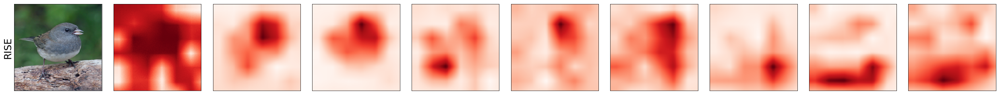

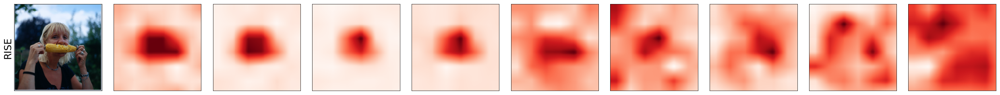

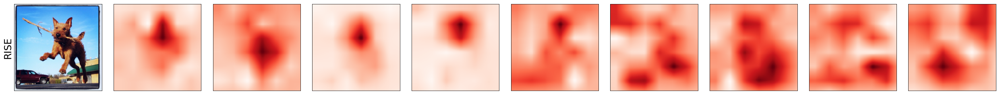

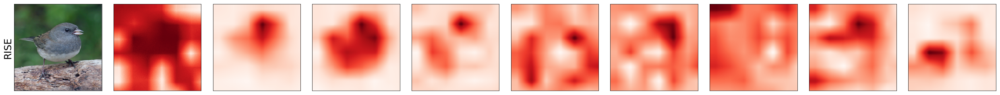

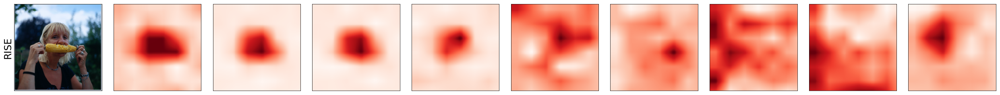

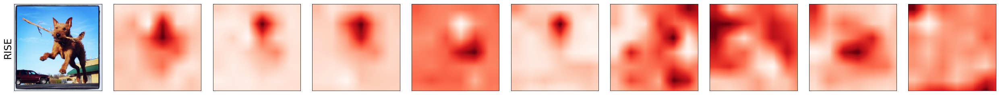

In [97]:
methods = [
    'contrastive_excitation_backprop',
    'deconvnet',
    'excitation_backprop',
    'grad_cam',
    'gradient',
    'guided_backprop',
    # 'rise'
]

methods = ['rise']

method_names = {
    'contrastive_excitation_backprop': 'c-MWP',
    'deconvnet': 'DeConv',
    'excitation_backprop': 'MWP',
    'grad_cam': 'G-CAM',
    'gradient': 'Grad',
    'guided_backprop': 'Guided',
    'rise': 'RISE',
}

for rand_type in ["cascade", "independent"]:
# for rand_type in ["independent"]:
    for method in methods:
        for img_name, class_id, class_name in examples:
            prefix = "{}-{}-{}-{}-class{}".format(arch, method, rand_type, img_name, class_id)
            results_prefix = os.path.join(base_results_dir, prefix)
            results = torch.load("{}.pth".format(results_prefix))
            if method == "gradient":
                include_title = True
                suffix = "_short_title"
            else:
                include_title = False
                suffix = "_short"
            save_path_prefix = os.path.join(base_results_dir, "figures", prefix)
            save_path = "{}{}.pdf".format(save_path_prefix, suffix)
            plot_results(results, method_name=method_names[method], include_title=include_title, save_path=save_path,
                        modules_to_run=modules_to_run, include_orig=True)